In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings; warnings.filterwarnings('ignore')

In [3]:
import tensorflow as tf

In [4]:
import numpy as np

In [5]:
import cv2

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
from configs import CONFIG_MAP



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [8]:
from trained_model import TrainedModel

In [9]:
from image_vae import Autoencoder

In [10]:
from pathlib import Path

In [11]:
from magenta.music import sequence_proto_to_midi_file

In [12]:
from magenta.music.notebook_utils import play_sequence, plot_sequence

In [13]:
from IPython.display import display

In [14]:
from ipywidgets import VBox, Layout, Image, Audio

In [15]:
import PIL

In [16]:
from magenta.scripts.convert_dir_to_note_sequences import convert_midi

In [17]:
config = CONFIG_MAP['cat-mel_2bar_small']

In [18]:
checkpoint_dir = '../../checkpoints10/train'

In [19]:
tf.reset_default_graph()

In [20]:
model = TrainedModel(config, 16, checkpoint_dir)


INFO:tensorflow:Building MusicVAE model with BidirectionalLstmEncoder, CategoricalLstmDecoder, and hparams:
{'max_seq_len': 32, 'z_size': 256, 'free_bits': 0, 'max_beta': 0.2, 'beta_rate': 0.99999, 'batch_size': 16, 'grad_clip': 1.0, 'clip_mode': 'global_norm', 'grad_norm_clip_to_zero': 10000, 'learning_rate': 0.001, 'decay_rate': 0.9999, 'min_learning_rate': 1e-05, 'conditional': True, 'dec_rnn_size': [256, 256], 'enc_rnn_size': [512], 'dropout_keep_prob': 1.0, 'sampling_schedule': 'inverse_sigmoid', 'sampling_rate': 1000, 'use_cudnn': False, 'residual_encoder': False, 'residual_decoder': False, 'image_batch_size': 16}

yayayayaya
INFO:tensorflow:
Encoder Cells (bidirectional):
  units: [512]


Instructions for updating:
This class is equivalent as tf.keras.layers.StackedRNNCells, and will be replaced by that in Tensorflow 2.0.
INFO:tensorflow:
Decoder Cells:
  units: [256, 256]



Instructions for updating:
Use `tf.cast` instead.








Instructions for updating:
Use keras.layers.D

In [21]:
IMG_PATH_POS = Path('../../../../GAPED/Positive/')

In [22]:
images = np.random.choice(list(map(str, IMG_PATH_POS.glob('*.jpg'))), size=5)

In [23]:
images

array(['../../../../GAPED/Positive/P101.jpg',
       '../../../../GAPED/Positive/P073.jpg',
       '../../../../GAPED/Positive/P121.jpg',
       '../../../../GAPED/Positive/P010.jpg',
       '../../../../GAPED/Positive/P110.jpg'], dtype='<U36')

In [24]:
def decode_img(path):
    img = cv2.imread(path)
    img = np.asarray(img).astype(np.float32) / 255.
    img = cv2.resize(img, (64, 64))
    return img

In [25]:
img = [decode_img(path) for path in images]

In [26]:
img = np.stack(img, axis=0)

In [27]:
img.shape, img.dtype

((5, 64, 64, 3), dtype('float32'))

In [28]:
output_ns = model.image_to_music(img)

In [29]:
len(output_ns)

5

Loading BokehJS ...

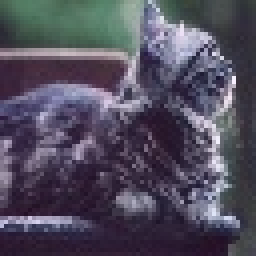

Loading BokehJS ...

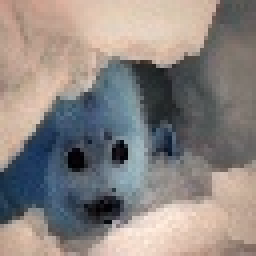

Loading BokehJS ...

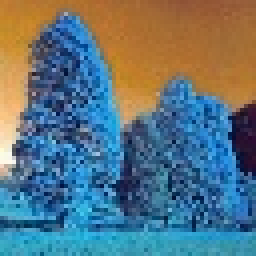

Loading BokehJS ...

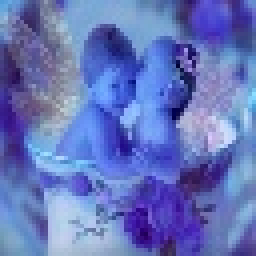

Loading BokehJS ...

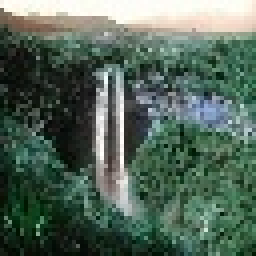

In [30]:
for i, ns in enumerate(output_ns):
    plot_sequence(ns)
    play_sequence(ns)
    image = PIL.Image.fromarray((img[i] * 255.).astype(np.uint8))
    display(image.resize((256, 256)))

In [31]:
IMG_PATH_NEG = Path('../../../../GAPED/Negative/')

In [39]:
images_neg = np.random.choice(list(map(str, IMG_PATH_NEG.glob('*.jpg'))), size=5)

In [40]:
images_neg

array(['../../../../GAPED/Negative/H036.jpg',
       '../../../../GAPED/Negative/A034.jpg',
       '../../../../GAPED/Negative/H051.jpg',
       '../../../../GAPED/Negative/Sn002.jpg',
       '../../../../GAPED/Negative/Sp084.jpg'], dtype='<U36')

In [41]:
images_neg = np.stack([decode_img(path) for path in images_neg])

In [42]:
images_neg.shape, images_neg.dtype

((5, 64, 64, 3), dtype('float32'))

In [43]:
output_ns_neg = model.image_to_music(images_neg)

Loading BokehJS ...

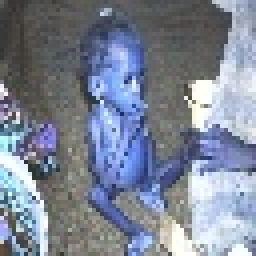

Loading BokehJS ...

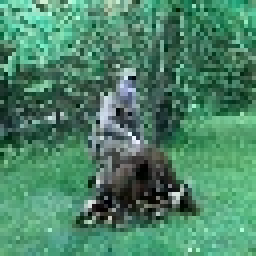

Loading BokehJS ...

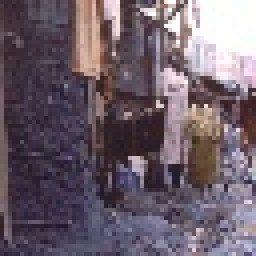

Loading BokehJS ...

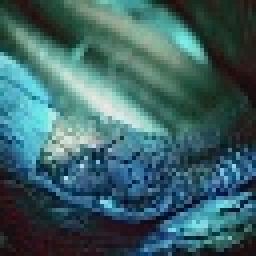

Loading BokehJS ...

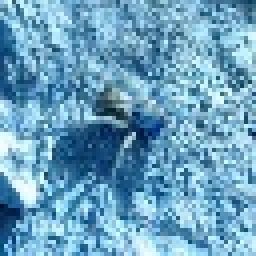

In [44]:
for i, ns in enumerate(output_ns_neg):
    plot_sequence(ns)
    play_sequence(ns)
    image = PIL.Image.fromarray((images_neg[i] * 255.).astype(np.uint8))
    display(image.resize((256, 256)))

In [45]:
MIDI_PATH_POS = Path('../../../../MIDI/Positive/')

In [46]:
midis = np.random.choice(list(map(str, MIDI_PATH_POS.glob('*.mid'))), size=5)

In [47]:
midis

array(['../../../../MIDI/Positive/Dancing Queen.2.mid',
       '../../../../MIDI/Positive/I Want It That Way.mid',
       '../../../../MIDI/Positive/Another Town, Another Train.mid',
       '../../../../MIDI/Positive/Name of the Game.1.mid',
       '../../../../MIDI/Positive/Nights on Broadway.3.mid'], dtype='<U72')

In [48]:
midis = [convert_midi('', '', path) for path in midis]


INFO:tensorflow:Converted MIDI file ../../../../MIDI/Positive/Dancing Queen.2.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Positive/I Want It That Way.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Positive/Another Town, Another Train.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Positive/Name of the Game.1.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Positive/Nights on Broadway.3.mid.


In [65]:
result_midis = []
for midi in midis:
    if midi is not None:
        tensors = config.data_converter.to_tensors(midi)
        if len(tensors[0]) > 0:
            ns = config.data_converter.to_notesequences(tensors[0])
            print(ns[0])
            result_midis.append(ns[0])
#midis = [config.data_converter.to_notesequences(config.data_converter.to_tensors(midi)[0])[0] for midi in midis if midi is not None]

5
5
5
5


In [62]:
output_imgs_pos = model.music_to_image(result_midis)

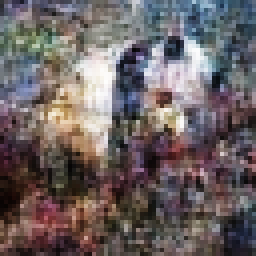

Loading BokehJS ...

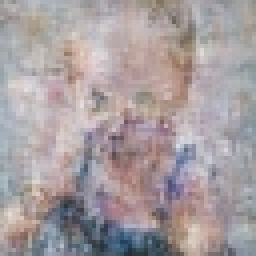

Loading BokehJS ...

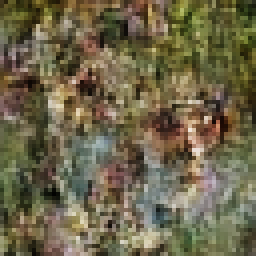

Loading BokehJS ...

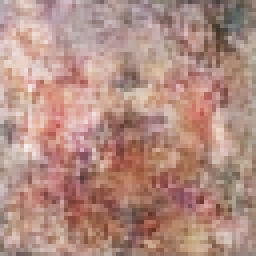

Loading BokehJS ...

In [66]:
for i, img in enumerate(output_imgs_pos):
    image = PIL.Image.fromarray((img * 255.).astype(np.uint8))
    display(image.resize((256, 256)))
    plot_sequence(result_midis[i])
    play_sequence(result_midis[i])

In [67]:
MIDI_PATH_NEG = Path('../../../../MIDI/Negative/')

In [68]:
midis_neg = np.random.choice(list(map(str, MIDI_PATH_NEG.glob('*.mid'))), size=5)

In [69]:
midis_neg

array(['../../../../MIDI/Negative/Medley.1.mid',
       '../../../../MIDI/Negative/The Winner Takes It All.3.mid',
       '../../../../MIDI/Negative/Over Now.mid',
       '../../../../MIDI/Negative/S.O.S.1.mid',
       "../../../../MIDI/Negative/Janie's Got a Gun.4.mid"], dtype='<U75')

In [70]:
midis_neg = [convert_midi('', '', path) for path in midis_neg]

INFO:tensorflow:Converted MIDI file ../../../../MIDI/Negative/Medley.1.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Negative/The Winner Takes It All.3.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Negative/Over Now.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Negative/S.O.S.1.mid.
INFO:tensorflow:Converted MIDI file ../../../../MIDI/Negative/Janie's Got a Gun.4.mid.


In [71]:
midis_neg = [config.data_converter.to_notesequences(config.data_converter.to_tensors(midi)[0])[0] for midi in midis_neg if midi is not None]

In [72]:
output_imgs_neg = model.music_to_image(midis_neg)

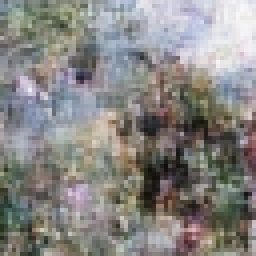

Loading BokehJS ...

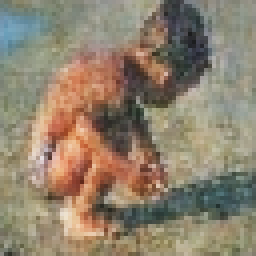

Loading BokehJS ...

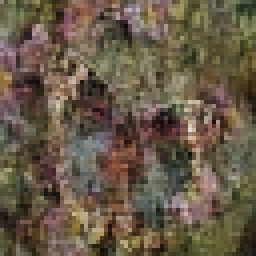

Loading BokehJS ...

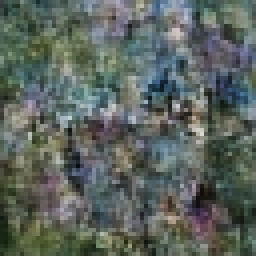

Loading BokehJS ...

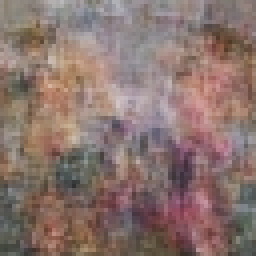

Loading BokehJS ...

In [73]:
for i, img in enumerate(output_imgs_neg):
    image = PIL.Image.fromarray((img * 255.).astype(np.uint8))
    display(image.resize((256, 256)))
    plot_sequence(midis_neg[i])
    play_sequence(midis_neg[i])